## lesson-4

### 1. скачать набор данных маркетинговых кампаний отсюда https://www.kaggle.com/davinwijaya/customer-retention

In [1]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split

In [2]:
df = pd.read_csv('data.csv')
df.head(3)

,recency,history,used_discount,used_bogo,zip_code,is_referral,channel,offer,conversion
0,10,142.44,1,0,Surburban,0,Phone,Buy One Get One,0
1,6,329.08,1,1,Rural,1,Web,No Offer,0
2,7,180.65,0,1,Surburban,1,Web,Buy One Get One,0


In [3]:
df.isna().sum()

recency          0
history          0
used_discount    0
used_bogo        0
zip_code         0
is_referral      0
channel          0
offer            0
conversion       0
dtype: int64

### 2. там поле conversion - это целевая переменная, а offer - коммуникация. Переименовать поля (conversion -> target, offer -> treatment) и привести поле treatment к бинарному виду (1 или 0, т.е было какое-то предложение или нет) - значение No Offer означает отсутствие коммуникации, а все остальные - наличие.

In [4]:
df = df.rename(columns={'conversion': 'target', 'offer': 'treatment'})
df.loc[(df.treatment != "No Offer"), 'treatment'] = 1
df.loc[(df.treatment == "No Offer"), 'treatment'] = 0
df.head(3)

,recency,history,used_discount,used_bogo,zip_code,is_referral,channel,treatment,target
0,10,142.44,1,0,Surburban,0,Phone,1,0
1,6,329.08,1,1,Rural,1,Web,0,0
2,7,180.65,0,1,Surburban,1,Web,1,0


### 3. сделать разбиение набора данных не тренировочную и тестовую выборки

In [5]:
indices_train, indices_test = train_test_split(df.index, test_size=0.3, random_state=42)

### 4. сделать feature engineering на ваше усмотрение (допускается свобода выбора методов)

In [6]:
df["recency"].value_counts()

1     8952
10    7565
2     7537
9     6441
3     5904
4     5077
6     4605
5     4510
7     4078
11    3504
8     3495
12    2332
Name: recency, dtype: int64

In [7]:
df["history"].value_counts()

29.99     7947
81.20        9
53.79        9
142.94       8
35.40        8
          ... 
701.66       1
246.45       1
798.83       1
125.19       1
104.00       1
Name: history, Length: 34833, dtype: int64

In [8]:
df["used_discount"].value_counts()

1    35266
0    28734
Name: used_discount, dtype: int64

In [9]:
df["used_bogo"].value_counts()

1    35182
0    28818
Name: used_bogo, dtype: int64

In [10]:
df["zip_code"].value_counts()

Surburban    28776
Urban        25661
Rural         9563
Name: zip_code, dtype: int64

In [11]:
df["is_referral"].value_counts()

1    32144
0    31856
Name: is_referral, dtype: int64

In [12]:
df["channel"].value_counts()

Web             28217
Phone           28021
Multichannel     7762
Name: channel, dtype: int64

In [13]:
df["treatment"].value_counts()

1    42694
0    21306
Name: treatment, dtype: int64

In [14]:
df["target"].value_counts()

0    54606
1     9394
Name: target, dtype: int64

In [15]:
df.loc[(df.zip_code == "Rural"), 'zip_code'] = 1
df.loc[(df.zip_code == "Surburban"), 'zip_code'] = 2
df.loc[(df.zip_code == "Urban"), 'zip_code'] = 3
df.head(3)

,recency,history,used_discount,used_bogo,zip_code,is_referral,channel,treatment,target
0,10,142.44,1,0,2,0,Phone,1,0
1,6,329.08,1,1,1,1,Web,0,0
2,7,180.65,0,1,2,1,Web,1,0


In [16]:
df.loc[(df.channel == "Web"), 'web'] = 1
df.loc[(df.channel == "Phone"), 'phone'] = 1
df.loc[(df.channel == "Multichannel"), ('web', 'phone')] = 1
df.loc[df.web.isna(), 'web'] = 0
df.loc[df.phone.isna(), 'phone'] = 0
df.drop('channel', 1, inplace=True)
df.head(3)

,recency,history,used_discount,used_bogo,zip_code,is_referral,treatment,target,web,phone
0,10,142.44,1,0,2,0,1,0,0.0,1.0
1,6,329.08,1,1,1,1,0,0,1.0,0.0
2,7,180.65,0,1,2,1,1,0,1.0,0.0


#### Target encoding

##### mean_target_by_recency

In [17]:
train_cp = df.loc[indices_train, :].copy()
mean_target_by_recency = train_cp.groupby(['recency'], as_index=False).agg({'target':'mean'})\
                                            .rename(columns={'target':'mean_target_by_recency'})

In [18]:
df = df.merge(mean_target_by_recency, on=['recency'], how='left')

### 5. провести uplift-моделирование 3 способами: одна модель с признаком коммуникации (S learner), модель с трансформацией таргета (трансформация классов п. 2. 1) и вариант с двумя независимыми моделями

In [19]:
X_train = df.loc[indices_train, :].drop(["treatment", "target"] , 1)
y_train = df.loc[indices_train, "target"]
treatment_train = df.loc[indices_train, "treatment"]

X_test = df.loc[indices_test, :].drop(["treatment", "target"] , 1)
y_test = df.loc[indices_test, "target"]
treatment_test = df.loc[indices_test, "treatment"]

In [20]:
from sklift.metrics import uplift_at_k
from sklift.models import SoloModel, ClassTransformation, TwoModels

from sklearn.ensemble import RandomForestClassifier

In [21]:
X_train.head(3)

,recency,history,used_discount,used_bogo,zip_code,is_referral,web,phone,mean_target_by_recency
9656,7,434.35,1,0,3,1,1.0,0.0,0.137967
63037,1,376.59,1,0,2,0,1.0,1.0,0.194710
31405,3,140.34,0,1,3,1,0.0,1.0,0.162442


#### SoloModel

In [22]:
sm = SoloModel(RandomForestClassifier(max_depth=3, random_state=42))
sm = sm.fit(X_train, y_train, treatment_train)

uplift_sm = sm.predict(X_test)

sm_score_30 = uplift_at_k(y_true=y_test, uplift=uplift_sm, treatment=treatment_test, strategy='by_group', k=0.3)
print(f'uplift@30%: {sm_score_30:.4f}')

uplift@30%: 0.0894


#### ClassTransformation

In [23]:
ct = ClassTransformation(RandomForestClassifier(max_depth=4, random_state=42))
ct = ct.fit(X_train, y_train, treatment_train)

uplift_ct = ct.predict(X_test)

ct_score_30 = uplift_at_k(y_true=y_test, uplift=uplift_ct, treatment=treatment_test, strategy='by_group', k=0.3)
print(f'uplift@30%: {ct_score_30:.4f}')

<ipython-input-23-5fa951656a74>:2: UserWarning: It is recommended to use this approach on treatment balanced data. Current sample size is unbalanced.
  ct = ct.fit(X_train, y_train, treatment_train)


uplift@30%: 0.0954


#### TwoModels

In [24]:
tm = TwoModels(estimator_trmnt = RandomForestClassifier(max_depth=4, random_state=42),
    estimator_ctrl = RandomForestClassifier(max_depth=4, random_state=42))

tm = tm.fit(X_train, y_train, treatment_train)

uplift_tm = tm.predict(X_test)

tm_score_30 = uplift_at_k(y_true=y_test, uplift=uplift_tm, treatment=treatment_test, strategy='by_group', k=0.3)
print(f'uplift@10%: {tm_score_30:.4f}')

uplift@10%: 0.0917


### 6. в конце вывести единую таблицу сравнения метрик uplift@10%, uplift@20% этих 3 моделей

#### SoloModels

In [25]:
sm_score_10 = uplift_at_k(y_true=y_test, uplift=uplift_sm, treatment=treatment_test, strategy='by_group', k=0.1)
print(f'uplift@10%: {sm_score_10:.4f}')

sm_score_20 = uplift_at_k(y_true=y_test, uplift=uplift_sm, treatment=treatment_test, strategy='by_group', k=0.2)
print(f'uplift@20%: {sm_score_20:.4f}')

uplift@10%: 0.1409
uplift@20%: 0.1049


#### ClassTransformation

In [26]:
ct_score_10 = uplift_at_k(y_true=y_test, uplift=uplift_ct, treatment=treatment_test, strategy='by_group', k=0.1)
print(f'uplift@10%: {ct_score_10:.4f}')

ct_score_20 = uplift_at_k(y_true=y_test, uplift=uplift_ct, treatment=treatment_test, strategy='by_group', k=0.2)
print(f'uplift@20%: {ct_score_20:.4f}')

uplift@10%: 0.1316
uplift@20%: 0.1121


#### TwoModels

In [27]:
tm_score_10 = uplift_at_k(y_true=y_test, uplift=uplift_tm, treatment=treatment_test, strategy='by_group', k=0.1)
print(f'uplift@10%: {tm_score_10:.4f}')

tm_score_20 = uplift_at_k(y_true=y_test, uplift=uplift_tm, treatment=treatment_test, strategy='by_group', k=0.2)
print(f'uplift@20%: {tm_score_20:.4f}')

uplift@10%: 0.1158
uplift@20%: 0.0892


In [28]:
united_table = pd.DataFrame({'models': ['SoloModel', 'ClassTransformation', 'TwoModels'], 
                             'uplift@10%': [sm_score_10, ct_score_10, tm_score_10], 
                             'uplift@20%': [sm_score_20, ct_score_20, tm_score_20]})
united_table

,models,uplift@10%,uplift@20%
0,SoloModel,0.140855,0.104867
1,ClassTransformation,0.131586,0.112100
2,TwoModels,0.115797,0.089152


### 7. построить модель UpliftTreeClassifier и попытаться описать словами полученное дерево

In [29]:
features = [col for col in X_train]

In [30]:
import os

os.environ['PATH'] = os.environ['PATH']+';'+os.environ['CONDA_PREFIX']+r"\Library\bin\graphviz"

Wall time: 28.4 s


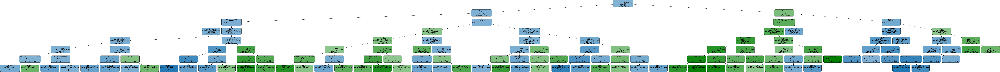

In [31]:
%%time
from IPython.display import display, Image
from causalml.inference.tree import UpliftTreeClassifier, UpliftRandomForestClassifier
from causalml.inference.tree import uplift_tree_string, uplift_tree_plot

uplift_model = UpliftTreeClassifier(max_depth=8, min_samples_leaf=200, min_samples_treatment=50,
                                    n_reg=100, evaluationFunction='KL', control_name='control')

uplift_model.fit(X_train.values,
                 treatment=treatment_train.map({1: 'treatment1', 0: 'control'}).values,
                 y=y_train.values)

graph = uplift_tree_plot(uplift_model.fitted_uplift_tree, features)
Image(graph.create_png())

#### Вывод:

Разбиение которое сильнее всего уменьшает энтропию в данных: zip_code >= 1.2

Условия для группы клиентов (0.7%) в которой uplift score самый большой (0.1504) : zip_code < 1.2, used_discount < 0.1, recency >= 6, recency >= 6.6, mean_target_by_recency < 0.12430851576334875, history < 180.6756, mean_target_by_recency >= 0.11270531014780565.

Глубина дерева = 8.

### 8. (опционально) для модели S learner (модель с дополнительным признаком коммуникации) построить зависимость таргета (конверсии - поле conversion) от значения uplift

#### 1) сделать прогноз и получить uplift для тестовой выборки

In [32]:
sm = SoloModel(RandomForestClassifier(max_depth=3, random_state=42))
sm = sm.fit(X_train, y_train, treatment_train)

uplift_sm = sm.predict(X_test)

uplift_sm

array([0.03444433, 0.04785538, 0.04583528, ..., 0.03900715, 0.03515234,
       0.04294997])

#### 2) отсортировать тестовую выборку по uplift по убыванию

In [33]:
X_test_sorted = X_test.assign(uplift_sm=uplift_sm).sort_values(by="uplift_sm", ascending=False)
X_test_sorted.head(3)

,recency,history,used_discount,used_bogo,zip_code,is_referral,web,phone,mean_target_by_recency,uplift_sm
2354,10,293.35,1,1,3,0,0.0,1.0,0.112334,0.05451
51538,9,481.83,1,1,3,0,0.0,1.0,0.114191,0.05451
48258,10,308.99,1,1,3,0,0.0,1.0,0.112334,0.05451


#### 3) разбить на децили (pandas qcut вам в помощь)

In [34]:
X_test_sorted["decile"] = pd.qcut(X_test_sorted['uplift_sm'], q=10)
X_test_sorted["decile"]

2354      (0.048, 0.0545]
51538     (0.048, 0.0545]
48258     (0.048, 0.0545]
36540     (0.048, 0.0545]
24962     (0.048, 0.0545]
               ...       
27900    (0.0138, 0.0308]
58278    (0.0138, 0.0308]
13053    (0.0138, 0.0308]
62297    (0.0138, 0.0308]
48417    (0.0138, 0.0308]
Name: decile, Length: 19200, dtype: category
Categories (10, interval[float64]): [(0.0138, 0.0308] < (0.0308, 0.0342] < (0.0342, 0.036] < (0.036, 0.038] ... (0.0414, 0.0441] < (0.0441, 0.0458] < (0.0458, 0.048] < (0.048, 0.0545]]

#### 4) для каждого дециля посчитать среднюю conversion

In [35]:
uplift_target = X_test_sorted.join(y_test).groupby(by=["decile"])["target"].mean()
uplift_target

decile
(0.0138, 0.0308]    0.172998
(0.0308, 0.0342]    0.142635
(0.0342, 0.036]     0.122946
(0.036, 0.038]      0.103646
(0.038, 0.0395]     0.142187
(0.0395, 0.0414]    0.146708
(0.0414, 0.0441]    0.140388
(0.0441, 0.0458]    0.122981
(0.0458, 0.048]     0.150286
(0.048, 0.0545]     0.218571
Name: target, dtype: float64

In [36]:
import matplotlib.pyplot as plt

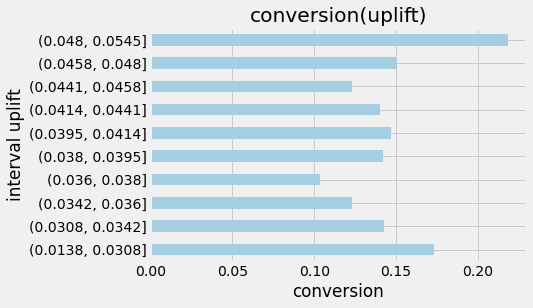

In [37]:
uplift_target.plot(kind = 'barh')
plt.title('conversion(uplift)')
plt.xlabel('conversion')
plt.ylabel('interval uplift')
plt.show()

### 9. (опционально) построить модель UpliftRandomForestClassifier и попытаться описать словами полученное дерево

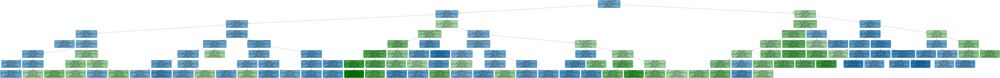

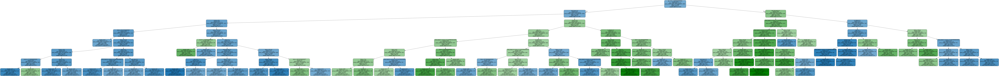

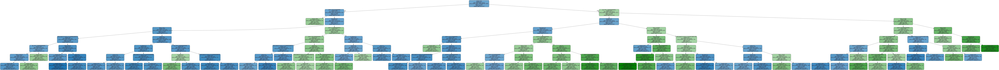

Wall time: 27.7 s


In [38]:
%%time
uplift_model = UpliftRandomForestClassifier(max_depth=8, min_samples_leaf=200, n_estimators = 3, min_samples_treatment=50,
                                    n_reg=100, evaluationFunction='KL', control_name='control')

uplift_model.fit(X_train.values,
                 treatment=treatment_train.map({1: 'treatment1', 0: 'control'}).values,
                 y=y_train.values)

for i in range(uplift_model.n_estimators):
    graph = uplift_tree_plot(uplift_model.uplift_forest[i].fitted_uplift_tree, features)
    display(Image(graph.create_png()))

#### Вывод:

Разбиение которое сильнее всего уменьшает энтропию в Bootstrap выборке 1-го дерева: used_discount >= 0.1
    
Разбиение которое сильнее всего уменьшает энтропию в Bootstrap выборке 2-го дерева: is_referral >= 0.1

Разбиение которое сильнее всего уменьшает энтропию в Bootstrap выборке 3-го дерева: zip_code >= 1.2

Условия для группы клиентов (0.8%) в Bootstrap выборке 1-го дерева в которой uplift score самый большой (0.2193) : used_discount >= 0.1, zip_code < 1.2, used_bogo < 0.1, web >= 0.1, is_referral < 0.1, mean_target_by_recency >= 0.13034623217922606, recency < 5.

Глубина деревьев = 8.